## Описание проекта

Исследование проводится для фонда «Shut Up and Take My Money». В ходе исследования рассматривается рынок общественного питания Москвы — анализируются его особенности, в частности в сегменте кофеен, и выдвигаются рекомендации по выбору места, режима работы и средних цен для новой кофейни.<br>

<b>Цель исследования</b> — выявление особенностей рынка общественного питания Москвы.

<b>Задачи исследования</b>:

- определить характеристики распределения заведений по категориям и принадлежности к сетям,

- определить характеристики распределения посадочных мест по категориям,

- определить характеристики географического распределения заведений,

- определить характеристики географического распределения средних рейтингов,

- определить характеристики географического распределения средних цен,

- выявить особенности сегмента кофеен,

- дать рекомендации по открытию кофейни в Москве в отношении места, режима работа и средней цены чашки капучино.



<b>Ход исследования</b><br>

Шаг 1. Загрузите данные и изучите общую информацию
<br>
Шаг 2. Выполните предобработку данных
<br>
Шаг 3. Анализ данных
<br>
Шаг 4. Детализируем исследование: открытие кофейни
<br>
Шаг 5. Подготовка презентации

## Описание данных

Файл `moscow_places.csv`:<br>

`name` — название заведения;<br>
`address` — адрес заведения;<br>
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;<br>
`hours` — информация о днях и часах работы;<br>
`lat` — широта географической точки, в которой находится заведение;<br>
`lng` — долгота географической точки, в которой находится заведение;<br>
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);<br>
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;<br>
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:<br>
- «Средний счёт: 1000–1500 ₽»;<br>
- «Цена чашки капучино: 130–220 ₽»;<br>
- «Цена бокала пива: 400–600 ₽» и так далее;<br>

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:<br>
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.<br>
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.<br>
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.<br>

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:<br>
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.<br>
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.<br>
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.<br>

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);<br>
`district` — административный район, в котором находится заведение, например Центральный административный округ;<br>
`seats` — количество посадочных мест.

## Шаг 1. Загрузите данные и изучите общую информацию

In [1]:
#Иморт библиотек
import pandas as pd
import numpy as np
import datetime as dt
from matplotlib import pyplot as plt
import plotly.express as px
from matplotlib.ticker import MultipleLocator
from matplotlib import pyplot as plt
from plotly import graph_objects as go
import seaborn as sns
import warnings
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
import folium
from folium import plugins
warnings.filterwarnings('ignore')

In [2]:
#Загрузка данных
try:
    moscow_places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
    print('Данные загружены')
except:
        try:
            moscow_places = pd.read_csv('/datasets/moscow_places.csv')
            print('Данные загружены из локального источника')
        except:
            print('Данные не загружены')

Данные загружены


In [3]:
# Случайные пять строк датафрейма
moscow_places.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
870,Кафе,кафе,"Москва, Коровинское шоссе, 1А",Северный административный округ,NaN,55.864616,37.544888,4.1,NaN,NaN,NaN,NaN,0,45.0
1609,Мельница,кафе,"Москва, Хорошёвское шоссе, 35, корп. 1",Северный административный округ,"ежедневно, 10:00–23:00",55.777344,37.521973,4.7,NaN,NaN,NaN,NaN,1,120.0
2399,Cofix,кофейня,"Москва, проспект Мира, 146",Северо-Восточный административный округ,"пн-пт 07:00–23:00; сб,вс 08:00–22:00",55.820589,37.641887,4.2,NaN,NaN,NaN,NaN,1,18.0
7306,Manny's Burger,"бар,паб","Москва, Мячковский бульвар, 3А",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.657948,37.751721,4.7,средние,Средний счёт:350–550 ₽,450.0,NaN,1,0.0
4088,Шоколадница,кофейня,"Москва, Зубовский бульвар, 17, стр. 1",Центральный административный округ,"ежедневно, круглосуточно",55.736329,37.590706,4.2,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,320.0


In [4]:
#информация о датафрейме
moscow_places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
#Значения столбца name
moscow_places['name'].value_counts().to_frame()

,name
Кафе,189
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
...,...
Турецкая Шаурма,1
Coffeeist,1
Пекарня № 1 Грузинская кухня,1
Botteganova Organic,1


In [6]:
#Значения столбца category
moscow_places['category'].value_counts().to_frame()

,category
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


In [7]:
#Значения столбца address
moscow_places['address'].value_counts().to_frame()

,address
"Москва, проспект Вернадского, 86В",28
"Москва, Усачёва улица, 26",26
"Москва, площадь Киевского Вокзала, 2",20
"Москва, Ярцевская улица, 19",20
"Москва, Лесная улица, 20, стр. 3",16
...,...
"Москва, Мосфильмовская улица, 17/25",1
"Москва, Михневская улица, 9А",1
"Москва, улица Можайский Вал, 8Д",1
"Москва, улица Свободы, 70",1


In [8]:
#Значения столбца hours
moscow_places['hours'].value_counts().to_frame()

,hours
"ежедневно, 10:00–22:00",759
"ежедневно, круглосуточно",730
"ежедневно, 11:00–23:00",396
"ежедневно, 10:00–23:00",310
"ежедневно, 12:00–00:00",254
...,...
"пн-чт 09:00–22:00; пт 09:00–23:00; сб,вс 10:00–23:00",1
"пн-пт 07:45–20:00; сб,вс 10:00–20:00",1
пн-ср 12:00–03:00; чт-сб 12:00–06:00; вс 12:00–03:00,1
"пн-пт 08:00–19:00; сб,вс 09:00–15:00",1


In [9]:
#Значения столбца hours
moscow_places['hours'].value_counts().to_frame()

,hours
"ежедневно, 10:00–22:00",759
"ежедневно, круглосуточно",730
"ежедневно, 11:00–23:00",396
"ежедневно, 10:00–23:00",310
"ежедневно, 12:00–00:00",254
...,...
"пн-чт 09:00–22:00; пт 09:00–23:00; сб,вс 10:00–23:00",1
"пн-пт 07:45–20:00; сб,вс 10:00–20:00",1
пн-ср 12:00–03:00; чт-сб 12:00–06:00; вс 12:00–03:00,1
"пн-пт 08:00–19:00; сб,вс 09:00–15:00",1


In [10]:
#Значения столбца rating
moscow_places['rating'].describe().to_frame()

,rating
count,8406.000000
mean,4.229895
std,0.470348
min,1.000000
25%,4.100000
50%,4.300000
75%,4.400000
max,5.000000


In [11]:
#Значения столбца price
moscow_places['price'].value_counts().to_frame()

,price
средние,2117
выше среднего,564
высокие,478
низкие,156


In [12]:
#Значения столбца avg_bill
moscow_places['avg_bill'].value_counts().to_frame()

,avg_bill
Средний счёт:1000–1500 ₽,241
Средний счёт:1500–2000 ₽,120
Средний счёт:300–500 ₽,90
Средний счёт:500–1000 ₽,78
Средний счёт:1500–2500 ₽,68
...,...
Цена чашки капучино:195–295 ₽,1
Средний счёт:1500–1880 ₽,1
Средний счёт:300–420 ₽,1
Цена чашки капучино:110–200 ₽,1


In [13]:
#Значения столбца middle_avg_bill
moscow_places['middle_avg_bill'].describe().to_frame()

,middle_avg_bill
count,3149.000000
mean,958.053668
std,1009.732845
min,0.000000
25%,375.000000
50%,750.000000
75%,1250.000000
max,35000.000000


In [14]:
#Значения столбца middle_coffee_cup 
moscow_places['middle_coffee_cup'].describe().to_frame()

,middle_coffee_cup
count,535.000000
mean,174.721495
std,88.951103
min,60.000000
25%,124.500000
50%,169.000000
75%,225.000000
max,1568.000000


In [15]:
#Значения столбца chain 
moscow_places['chain'].value_counts().to_frame()

,chain
0,5201
1,3205


In [16]:
#Значения столбца district 
moscow_places['district'].value_counts().to_frame()

,district
Центральный административный округ,2242
Северный административный округ,900
Южный административный округ,892
Северо-Восточный административный округ,891
Западный административный округ,851
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


In [17]:
#Значения столбца seats 
moscow_places['seats'].describe().to_frame()

,seats
count,4795.000000
mean,108.421689
std,122.833396
min,0.000000
25%,40.000000
50%,75.000000
75%,140.000000
max,1288.000000


### Вывод

Общее кол-во записей о заведениях 8406 в датасете.<br>
Все типы данных в столбцах датафрейма, кроме float в столбце `seats`, логически соответствуют необходимым по смыслу.<br>
Пропуски присутсвуют в столбцах : `hours price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`.<br>
Столбец `name` может содержать неявные дубликаты.

## Шаг 2. Выполните предобработку данных

In [18]:
#скопируем датафрейм для изменений
data = moscow_places

### Сетевые заведения

В описании данных в столбце `chain`, для маленьких сетей в разметке принадлежности объектов к сети могут встречаться ошибки.

In [19]:
#Перевод в нижний регистр столбца name
data['name'] = data['name'].str.lower()

Приведем все названия сетевых заведений общепита к нижнему регистру.

In [20]:
chain_in = data['name'].value_counts()[data['name'].value_counts() > 1].index
data.loc[data['name'].isin(chain_in), 'chain'] = 1

Подсчитаем количествово уникальных названий сетевых заведений общепита, которые встречаются больше одного раза.
С помощью isin() отфильтруем и проставим значение в столбце chain.

In [21]:
pd.options.display.max_seq_items = 1000
chain_in

Index(['кафе', 'шоколадница', 'домино'с пицца', 'додо пицца',
       'one price coffee', 'яндекс лавка', 'cofix', 'prime', 'хинкальная',
       'шаурма', 'кофепорт', 'кулинарная лавка братьев караваевых', 'теремок',
       'чайхана', 'ресторан', 'буханка', 'cofefest', 'столовая', 'му-му',
       'drive café', 'кофемания', 'андерсон', 'крошка картошка', 'скалка',
       'cinnabon', 'french bakery', 'тануки', 'штолле', 'хлеб насущный',
       'арамье', 'vasilchukí chaihona №1', 'wild bean cafe', 'osteria mario',
       'донер кебаб', 'сушистор', 'мск lounge', 'моремания', 'кафетерий',
       'бургер кинг', 'вареничная № 1', 'pizza express 24', 'правда кофе',
       'brasserie lambic', 'алло! пицца', 'джонджоли', 'кофейня', 'pizza hut',
       'бистро', 'кафе-столовая', 'халяль', 'кафе-бар', 'phobo', 'даблби',
       'стейк & бургер', 'франклинс бургер', 'krispy kreme', 'bổ',
       'волконский', 'самарканд', 'udcкафе', 'пекарня', 'буфет', 'kuzina',
       'академия', 'чайхона', 'грабли',

Есть сетевые заведения без конкретного названия: 'кафе', 'ресторан', 'хинкальная', и т.д.

In [22]:

chain_no = (['кафе', 'хинкальная', 'шаурма', 'чайхана', 'ресторан', 'кофейня', 'столовая', 'кафетерий', 
               'халяль', 'бистро', 'кафе-столовая', 'кафе-бар', 'грузинская кухня', 'чайхона', 'буфет', 
               'пекарня', 'кофе', 'кулинария', 'чайхана халяль', 'кофе с собой', 'чайная', 'японская кухня', 
               'пельменная', 'кафе бар', 'трапезная', 'шашлычная', 'сыроварня', 'поминальные обеды', 
               'восточная кухня', 'шаверма', 'выпечка', 'пиццерия', 'пончики', 'блины', 'свежая выпечка',
               'чайхана халаль','семейная пекарня', 'кафе-кулинария', 'кафе-пекарня', 'шашлык', 'шашлыки', 
               'чебуречная', 'хинкали', 'хачапури', 'китайская кухня',
               'китайский ресторан', 'блинная', 'вьетнамская кухня', 'вьетнамское кафе'])

data.loc[data['name'].isin(chain_no), 'chain'] = 0

Перевод заведения без конкретного названия в не сетевые.

In [23]:
data.query('chain == 1')['name'].nunique()

762

762 уникальных названия сетевых заведений общепита.

### Проверка дубликатов

In [24]:
data.query('chain == 1')['name'].sort_values().unique()

array(['1-я креветочная', '10 идеальных пицц', '18 грамм', '4 сезона',
       '7 сэндвичей', '8 вафель', '9 bar coffee', 'abc coffee roasters',
       'air coffee', 'americano black coffee & food', 'arabix',
       'arcus bar and food', 'asia gourmet', 'bakery', 'bb grill',
       'bb&burgers', 'bfl’s', 'bigсуши', 'black star burger', 'bodrero',
       'bon lavash', 'boston seafood & bar', 'bowl family',
       'brasserie lambic', 'bro&n', 'brooms', 'burger club',
       'burger heroes', 'bổ', 'cafe', 'cafe inn', 'café de paris',
       'camera obscura', 'camorra pizza e birra', 'campus',
       'carrots and beans', 'cassette cafe', 'chicha san chen', 'chicko',
       'cinnabon', 'city life', 'cofefest', 'coffee and the city',
       'coffee bean', 'coffee break', 'coffee guru', 'coffee in',
       'coffee like', 'coffee moose', 'coffee music', 'coffee party',
       'coffee point', 'coffee way', "coffeebar'17", 'coffeebrain',
       "coffeekaldi's", 'coffeeshop company', 'coffeeshots'

Названия имеют различные написания, хотя заведения явно относятся к одной сети. 

In [25]:
names_to_change = [('french bakery','french bakery sedelice'),
                   ("jeffrey's coffee" , "jeffrey's coffeeshop"),
                   ('white fox' , 'white fox cafe'),
                   ('wild bean' , 'wild bean cafe'), 
                   ('the wild bean cafe' , 'wild bean cafe'),
                   ('хинкали - gали!' , 'хинкали-gали!'),
                   ('чайхона № 1' , 'чайхона №1'),
                   ('черетто море' , 'черетто'),
                   ('яндекс лавка' , 'яндекс.лавка'),
                   ('кондитерская-кулинария брусника' , "брусника"),
                   ('кулинариум - кулинария, пироги, салаты' , 'кулинариум'),
                   ('мое кафе', 'моё кафе'),
                   ('хлеб насущный экспресс' , 'хлеб насущный'),]

for name in names_to_change:
    data.loc[data['name'] == name[0], 'name'] = name[1]

In [26]:
data.query('chain == 1')['name'].nunique()

749

Заменили неявные дубликаты в названиях сетевых заведений общепита.


Названия в не сетевых заведениях общепита могут назваться очень похоже, иметь различие в одном символе, и при этом быть совсем разными заведениями.

In [27]:
data[data[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
2467,хлеб насущный,булочная,"Москва, Комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.779720,37.654411,4.1,NaN,NaN,NaN,NaN,1,200.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,1,276.0


Найдено 4 строки с неявными дубликатами

In [28]:
data = data.drop(index=[1511, 2420, 2467, 3109]).reset_index(drop=True)

In [29]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [30]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [31]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

В столбцах `category`, `district` и `price` дубликатов нет.

In [32]:
data.duplicated().sum()

0

Явных дубликатов не обнаружено.

### Поиск пропущенных значений

In [33]:
def show_nan(data):
  df_nan = data.isna().sum().to_frame()
  df_nan[1] = data.isna().mean()
  df_nan.columns = ['NaN count', '%']
  return df_nan.style.background_gradient('Reds').format({'%':'{:.2%}'})

show_nan(data)

,NaN count,%
name,0,0.00%
category,0,0.00%
address,0,0.00%
district,0,0.00%
hours,535,6.37%
lat,0,0.00%
lng,0,0.00%
rating,0,0.00%
price,5087,60.55%
avg_bill,4586,54.58%


In [34]:
data.dropna(subset=['hours'], inplace=True)

Пропусков в столбце `hours` немного — всего 6,3%, их можно удалить.

В столбцах `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats` придётся оставить всё как есть. Здесь заполнение каким-нибудь медианным значением или заглушкой не представляется возможным — слишком много пропусков и слишком разнообразные и специфические данные. Заполнение в данном случае приведёт к большому искажению данных.

### Выбросы

In [35]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,7867.000000,7867.000000,7867.000000,3143.000000,534.000000,7867.000000,4492.000000
mean,55.750737,37.608039,4.244185,957.886096,174.514981,0.385280,107.798085
std,0.068766,0.096825,0.453046,1010.508023,88.906040,0.486692,119.226564
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.706883,37.539824,4.100000,375.000000,124.250000,0.000000,40.000000
50%,55.754221,37.604889,4.300000,750.000000,168.000000,0.000000,75.000000
75%,55.794428,37.662863,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


`middle_avg_bill`: минимальное значение 0, максимальное значение - 35000.

`middle_coffee_cup`: Слишком большое максимальное значение - 1568.

`seats` — 0 посадочных мест.

Данные в столбцах `rating` и `chain` выглядят нормально.

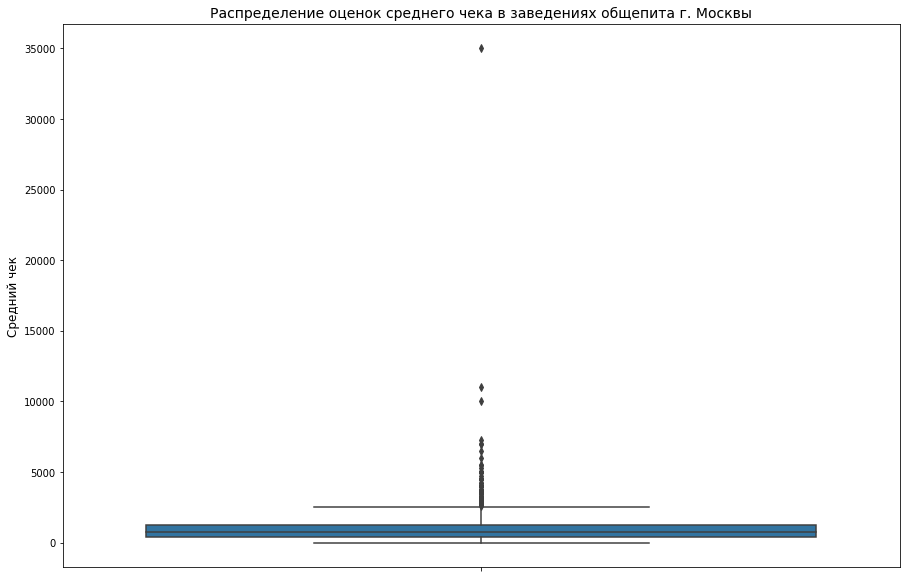

In [36]:
plt.figure(figsize=(15, 10))
sns.boxplot(y='middle_avg_bill', data=data)
plt.title('Распределение оценок среднего чека в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Средний чек', fontsize=12);
plt.show()

Данные выше 10000 слишком выделяются.

In [37]:
data.drop(labels=data.query('middle_avg_bill > 9999').index,
               axis=0,
               inplace=True)
data.reset_index(drop=True, inplace=True)

Удалили данные в столбце `middle_avg_bill` превышающие 10000.

In [38]:
data.query('middle_avg_bill == 0').shape[0]

1

Количесто строк со среднем чеком - 1. Эту строчку можно удалить.

In [39]:
data.drop(labels=data.query('middle_avg_bill == 0').index,
               axis=0,
               inplace=True)
data.reset_index(drop=True, inplace=True)

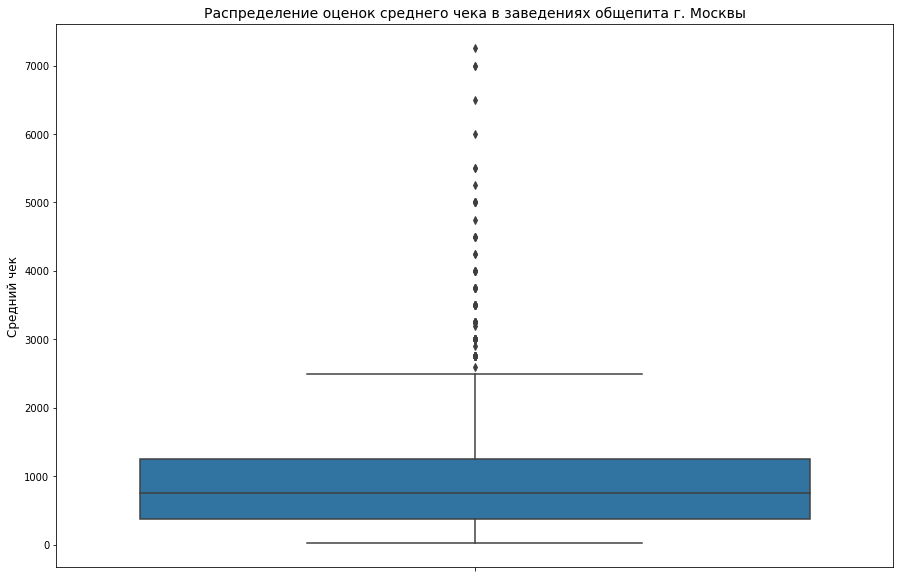

In [40]:
plt.figure(figsize=(15, 10))
sns.boxplot(y='middle_avg_bill', data=data)
plt.title('Распределение оценок среднего чека в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Средний чек', fontsize=12)
plt.show()

Столбец `middle_avg_bill` очистили от выбросов.

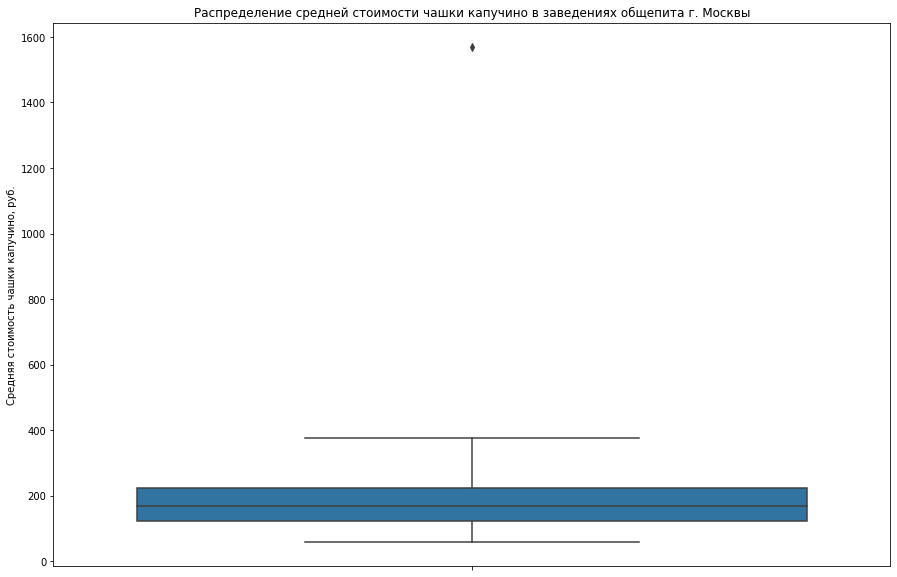

In [41]:
plt.figure(figsize=(15, 10))
sns.boxplot(y='middle_coffee_cup', data=data)
plt.title('Распределение средней стоимости чашки капучино в заведениях общепита г. Москвы', fontsize=12)
plt.ylabel('Средняя стоимость чашки капучино, руб.', fontsize=10)
plt.show()

1568 рублей - это явный выброс.

In [42]:
data.drop(labels=data.query('middle_coffee_cup > 1000').index,
               axis=0,
               inplace=True)
data.reset_index(drop=True, inplace=True)

Удалили данные в столбце `middle_coffee_cup` превышающие 1000.

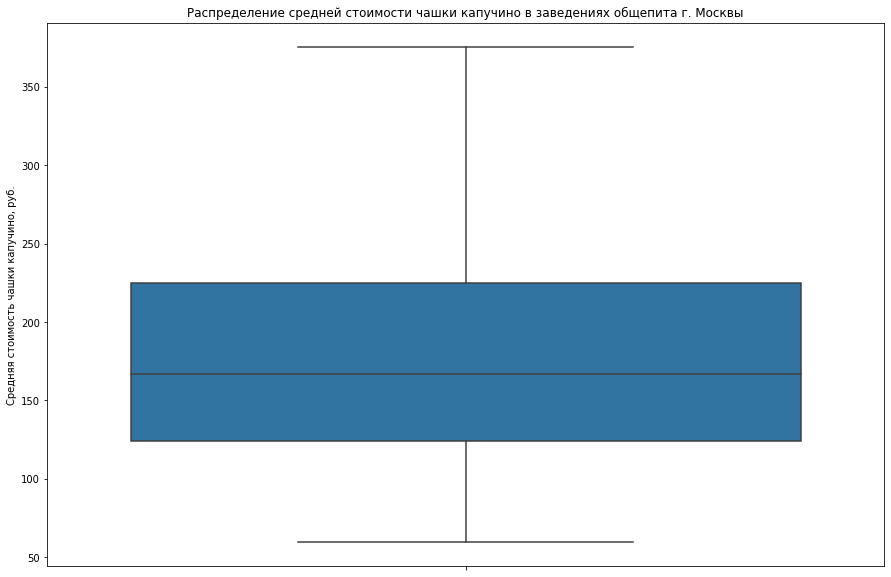

In [43]:
plt.figure(figsize=(15, 10))
sns.boxplot(y='middle_coffee_cup', data=data)
plt.title('Распределение средней стоимости чашки капучино в заведениях общепита г. Москвы', fontsize=12)
plt.ylabel('Средняя стоимость чашки капучино, руб.', fontsize=10)
plt.show()

Столбец `middle_coffee_cup` очистили от выбросов.

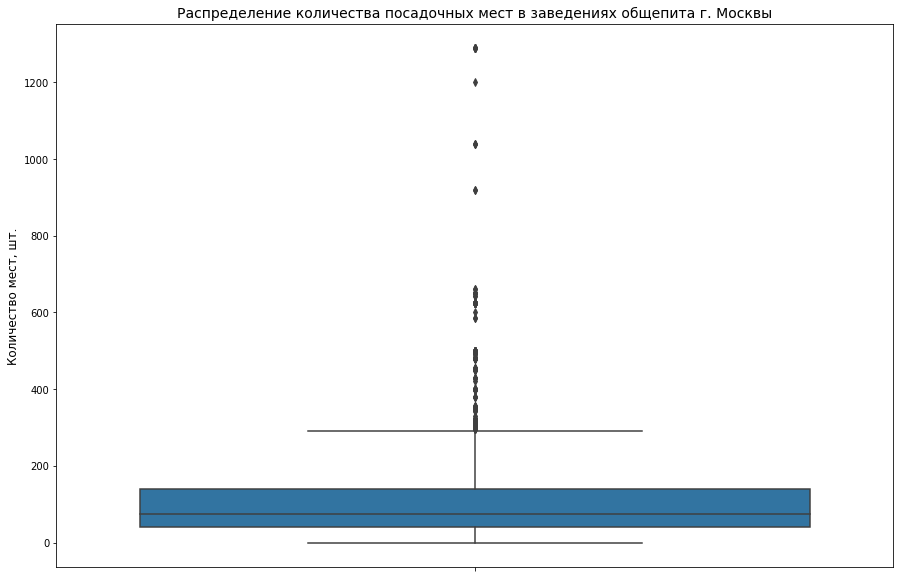

In [44]:
plt.figure(figsize=(15, 10))
sns.boxplot(y='seats', data=data)
plt.title('Распределение количества посадочных мест в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Количество мест, шт.', fontsize=12)
plt.show()

Удалим занчения выше 800.
Так же значения 0 в категорях: 'ресторан', 'столовая', 'кафе', 'бар,паб'. Остальные категории могут не иметь посадочных мест и рабоать на вынос.

In [45]:
data.drop(labels=data.query('seats > 800').index,
               axis=0,
               inplace=True)
data.reset_index(drop=True, inplace=True)

In [46]:
categories_to_clean = ['ресторан', 'столовая','кафе','бар,паб']

data.drop(labels=data.query(
    'seats == 0 and category in @categories_to_clean').index,
               axis=0,
               inplace=True)

data.reset_index(drop=True, inplace=True)

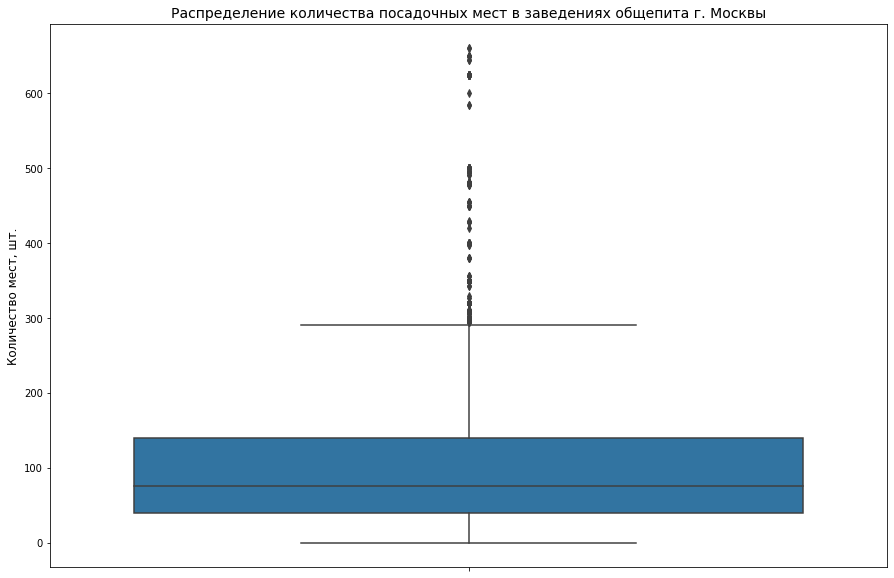

In [47]:
plt.figure(figsize=(15, 10))
sns.boxplot(y='seats', data=data)
plt.title('Распределение количества посадочных мест в заведениях общепита г. Москвы', fontsize=14)
plt.ylabel('Количество мест, шт.', fontsize=12)
plt.show()

### Создание дополнительных столбцов

In [48]:
data['street'] = data.apply(lambda x: x['address'].split(', ')[1],axis=1)

Столбец `street` с названием улицы, на которой находится заведение.

In [49]:
data['is_24/7'] = data['hours'].str.contains('ежедневно' and 'круглосуточно')

Столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [50]:
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
5991,bake&coffee,кофейня,"Москва, Южнопортовая улица, 16",Юго-Восточный административный округ,"ежедневно, 08:00–21:00",55.707387,37.683841,4.7,NaN,NaN,NaN,NaN,0,42.0,Южнопортовая улица,False
4724,по чесноку,ресторан,"Москва, Кожевническая улица, 7",Центральный административный округ,"ежедневно, 12:00–00:00",55.730336,37.645232,4.5,NaN,NaN,NaN,NaN,0,NaN,Кожевническая улица,False
1122,coffelab,кофейня,"Москва, улица Маршала Катукова, 26",Северо-Западный административный округ,"ежедневно, 09:00–18:00",55.801509,37.414147,3.8,NaN,Средний счёт:250–270 ₽,260.0,NaN,0,NaN,улица Маршала Катукова,False
3886,e. d. a.,ресторан,"Москва, 1-й Спасоналивковский переулок, 8, стр. 2",Центральный административный округ,пт 15:00–17:00,55.733300,37.616710,4.7,NaN,NaN,NaN,NaN,0,14.0,1-й Спасоналивковский переулок,False
868,vigor maker,кофейня,"Москва, проспект Мира, 119, стр. 227",Северо-Восточный административный округ,"пн-пт 08:30–21:00; сб,вс 10:00–21:00",55.825921,37.636862,4.4,средние,Цена чашки капучино:200–250 ₽,NaN,225.0,0,NaN,проспект Мира,False
2328,jaz-jiz,кафе,"Москва, Краснобогатырская улица, 2, стр. 17",Восточный административный округ,"ежедневно, круглосуточно",55.816152,37.686748,4.6,NaN,NaN,NaN,NaN,0,NaN,Краснобогатырская улица,True
3633,7 сэндвичей,кофейня,"Москва, Большой Саввинский переулок, 2, корп. 1",Центральный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–19:00",55.736588,37.570088,4.2,средние,Средний счёт:от 300 ₽,300.0,NaN,1,50.0,Большой Саввинский переулок,False
3574,istanbul,"бар,паб","Москва, улица Новый Арбат, 11",Центральный административный округ,"ежедневно, круглосуточно",55.752326,37.595970,4.2,средние,Средний счёт:500–1000 ₽,750.0,NaN,1,NaN,улица Новый Арбат,True
1544,чайхана баракат,кафе,"Москва, Новодмитровская улица, 2, корп. 2",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.804371,37.589988,4.3,средние,Средний счёт:230–250 ₽,240.0,NaN,1,44.0,Новодмитровская улица,True
6690,drive café,кафе,"Москва, Каширское шоссе, 57А",Южный административный округ,"ежедневно, круглосуточно",55.634298,37.701279,4.2,NaN,NaN,NaN,NaN,1,17.0,Каширское шоссе,True


### Вывод

Удалены неявные дубликаты в названиях заведений, восстановлен сетевой статус для некоторых заведений, некоторые названия приведены к уникальному виду, установлено отстутсвие явных дубликатов.<br>
Удалены пропуски в столбце `hours`, остальные столбы остались с пропусками так как — слишком много пропусков и слишком разнообразные и специфические данные.<br>
Удалены выбросы в столбцах `middle_avg_bill` и `middle_coffee_cup`, `seats`.<br>
Добавлены столбцы `street`, `is_24/7`<br>

## Шаг 3. Анализ данных

### Какие категории заведений представлены в данных?

In [51]:
category_count = pd.DataFrame(data['category'].value_counts())\
    .reset_index()\
    .rename(columns={
    'index': 'category',
    'category': 'rest_cnt'
})

fig = px.bar(category_count,
             x='category',
             y='rest_cnt',
             text=round(category_count['rest_cnt']/ category_count['rest_cnt'].sum() *100, 1),
             title='Количество заведений по категориям',
             template='none',
             labels={
                 'category': 'Категория',
                 'rest_cnt': 'Число заведений'
             },)

fig.update_layout(title_pad_l=300)

fig.show()

Наиболее распространенной категорией объектов общественного питания являются кафе.<br>
Их доля составляет 25,2%.
На втором месте рестораны - их доля рынка равна 25%.<br>
В топ-3 категорий заведений общественного питания также входят кофейни. Их доля составляет 17,9%.<br>
Доля баров/пабов от общего числа заведений составляет 9,5%; доля пиццерий - 8,1%, быстрое питание - 7,3%.<br>
Наименее распространены столовые 3,9% и булочные 3,2%<br>

### Исследуйте количество посадочных мест в местах по категориям

In [52]:
fig = px.bar(data.groupby('category', as_index=False).agg({
    'seats':
    'median'
}).sort_values(by='seats', ascending=False),
             x='category',
             y='seats',
             text='seats',
             title='v',
             template='none',
             labels={
                 'category': 'Категория',
                 'seats': 'Медианное количество мест'
             },)

fig.update_layout(title_pad_l=150)

fig.show()

Самое большое медианное кол-во посадочных мест приходится на категории: ресторан, бар и кофейня.

### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете

In [53]:
rests_by_chain_status = pd.DataFrame(data['chain'].value_counts())\
    .rename(index={0: 'несетевые', 1: 'сетевые'}, columns={'chain': 'rests_cnt'})\
    .reset_index()

fig = go.Figure(data=[
    go.Pie(labels=rests_by_chain_status['index'],
           values=rests_by_chain_status['rests_cnt'],
           hole=.5)
])

fig.update_layout(title='Соотношение количества сетевых и несетевых заведений',
                  title_pad_l=108,
                  )

fig.show()

Преобладают несетевые заведения общественного питания. Их доля составляет 63.1%.
Доля сетевых объектов составляет 36.9%.

### Какие категории заведений чаще являются сетевыми?

In [54]:
chain_data = data.query('chain == 1').reset_index().\
    groupby(['category', 'chain'],as_index=False).agg({'index': 'count'})

total_data = data.reset_index().\
    groupby(['category'],as_index=False).agg({'index': 'count'})

chain_data['share'] = round(chain_data['index']/total_data['index']*100,1)
chain_data

,category,chain,index,share
0,"бар,паб",1,159,21.5
1,булочная,1,149,60.1
2,быстрое питание,1,213,37.4
3,кафе,1,646,32.9
4,кофейня,1,721,51.8
5,пиццерия,1,343,54.7
6,ресторан,1,685,35.2
7,столовая,1,86,28.7


In [55]:
fig = px.bar(chain_data.sort_values('share', ascending=False), 
             x='category', 
             y='share',
            text='share',
            title='Доли сетевых заведений по категориям',
             labels={
                 'category': 'Категория',
                 'share': 'Доля в категории'
             },
             template='none')


fig.show() 

Самое большая доля сетевых заведений в категориях булочная, пиццерия и кофейня, а наименьшая — среди столовых и баров.

### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей

In [56]:
chain_top15 = (data.query('chain == 1').reset_index().groupby('name', as_index=False).agg({
    'index':
    'count',
    'category':
    'first'
}).rename(columns={
    'index': 'rest_cnt'
}).sort_values(by='rest_cnt').tail(15))

In [57]:
fig = px.bar(chain_top15,
             x='rest_cnt',
             y='name',
             color='category',
             text='rest_cnt',
             title='Топ-15 популярных сетей',
             labels={
                 'rest_cnt': 'Количество заведений',
                 'name': 'Название сети'
             },
             color_discrete_sequence=px.colors.qualitative.Set2,
             template='simple_white')

fig.update_layout(yaxis_categoryorder='total ascending',
                  title_pad_l=340,
                  legend=dict(title='Категория',
                              yanchor='bottom',
                              y=0.3,
                              xanchor='right',
                              x=0.95))

fig.show()

Самое большое количество заведений у сети «Шоколадница» — 118. У всех остальных заведений меньше — не более 77.<br>
К 15 крупнейшим сетям относятся кофейни, пиццерии, рестораны и кафе. Также есть одна крупная сеть булочных.

### Какие административные районы Москвы присутствуют в датасете

In [58]:
data['district_short'] = data['district'].map(lambda x: x.split()[0])

In [59]:
district_count = (data.reset_index().groupby(
    ['district_short', 'category'], as_index=False).agg({
        'index': 'count'
    }).rename(columns={'index': 'rest_cnt'}))

In [60]:
fig = px.bar(district_count,
             x='district_short',
             y='rest_cnt',
             color='category',
             text='rest_cnt',
             title='Распределение заведений по районам',
             labels={
                 'category': 'Категория',
                 'rest_cnt': 'Количество заведений',
                 'name': 'Название сети',
                 'district_short': 'Административный округ',
             },
             color_discrete_sequence=px.colors.qualitative.Set2,
             template='simple_white')

fig.update_layout(title_pad_l=180,
                  height=800,
                  xaxis_categoryorder='total descending',
                  uniformtext_minsize=12,
                  uniformtext_mode='hide',
                  legend=dict(title='Категория',
                              yanchor='top',
                              y=0.95,
                              xanchor='right',
                              x=1))
fig.show()

In [61]:
fig = px.bar(district_count.query("district_short != 'Центральный'"),
             x='district_short',
             y='rest_cnt',
             color='category',
             text='rest_cnt',
             title='Распределение заведений по районам, без Центрального района',
             labels={
                 'category': 'Категория',
                 'rest_cnt': 'Количество заведений',
                 'name': 'Название сети',
                 'district_short': 'Административный округ',
             },
             color_discrete_sequence=px.colors.qualitative.Set2,
             template='simple_white')

fig.update_layout(title_pad_l=180,
                  height=800,
                  xaxis_categoryorder='total descending',
                  uniformtext_minsize=12,
                  uniformtext_mode='hide',
                  legend=dict(title='Категория',
                              yanchor='top',
                              y=0.95,
                              xanchor='right',
                              x=1.1))
fig.show()

Наибольшее количество заведений сосредоточено в Центральном административном округе.<br>
Оно более чем в два раза превышает количество заведений любом из других округов Москвы.<br>
Наименее представлены заведения в Северо-Западном и Юго-Восточном административных округах.

### Визуализируйте распределение средних рейтингов по категориям заведений

In [62]:
fig = px.line(round(data.groupby('category', as_index=False).agg({
    'rating':
    'mean'
}).sort_values(by='rating', ascending=False),1),
             x='category',
             y='rating',
             text='rating',
             title='Распределение средних рейтингов по категориям заведений',
             template='simple_white',
             labels={
                 'category': 'Категория',
                 'rating': 'Средний рейтинг'
             },
            line_shape='hv')

fig.update_layout(title_pad_l=150)
fig.update_traces(textposition="top right")

fig.show()

Среднее значения средних рейтингов не имеют значительных различий в зависимости от категории заведения.<br>
Средняя оценка лидирующей категории бар/паб - 4.4.<br>
Соответственно, средняя оценка категории быстрое питание - 4.1<br>

### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [63]:
rating_district = data.groupby('district', as_index=False).agg({'rating':'mean'}).\
sort_values(by='rating', ascending=False)

In [64]:
#Загрузка данных
try:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
    print('Данные загружены')
except:
        try:
            state_geo =  '/datasets/admin_level_geomap.geojson'
            print('Данные загружены из локального источника')
        except:
            print('Данные не загружены')

Данные загружены


In [65]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
    reset=True,
).add_to(m)

m

Самые высокиe рейтинги заведений в центре Москвы

### Отобразите все заведения датасета на карте

In [66]:
m = folium.Map([55.751244, 37.618423], zoom_start=10)
heatmap = data[['lat','lng']]
m.add_child(plugins.HeatMap(heatmap, radius=14))
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

Самая высокая концентрация заведений в центре Москвы

### Найдите топ-15 улиц по количеству заведений

In [67]:
street_top15 = data.reset_index().groupby(['street'], as_index=False).agg({
    'index':
    'count'
}).sort_values(by='index', ascending=False).head(15)

In [68]:
street_top15

,street,index
1064,проспект Мира,175
754,Профсоюзная улица,112
511,Ленинский проспект,99
1061,проспект Вернадского,93
509,Ленинградский проспект,90
360,Дмитровское шоссе,85
442,Каширское шоссе,70
510,Ленинградское шоссе,67
289,Варшавское шоссе,66
532,Люблинская улица,56


In [69]:
street_top15_category = data.query(\
                          "street == ['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского', 'Ленинский проспект',\
                          'Ленинградский проспект', 'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе',\
                          'Ленинградское шоссе', 'Люблинская улица', 'улица Вавилова', 'Кутузовский проспект',\
                          'улица Миклухо-Маклая', 'Пятницкая улица', 'МКАД']")\
.reset_index().groupby(['street', 'category'], as_index=False).agg({
    'index':
    'count'
}).sort_values(by='index', ascending=False)


In [70]:
fig = px.bar(street_top15_category,
             x='index',
             y='street',
             color='category',
             text='index',
             title='Топ-15 улиц по количеству заведений',
             labels={
                 'index': 'Количество заведений',
                 'street': 'Название улицы'
             },
             color_discrete_sequence=px.colors.qualitative.Set2,
             template='simple_white')

fig.update_layout(yaxis_categoryorder='total ascending',
                  title_pad_l=340,
                  legend=dict(title='Категория',
                              yanchor='bottom',
                              y=0.3,
                              xanchor='right',
                              x=0.95))

fig.show()

Улицей с наибольшим количеством заведений является проспект Мира. Проспект Мира лидирует как по общему числу расположенных там заведений, так и по заведениям отдельных категорий.

Выделяется также МКАД количеством расположенных на нем кафе.

### Найдите улицы, на которых находится только один объект общепита.

In [71]:
one_in_street = data.reset_index().groupby(['street'], as_index=False).agg({\
    'index':\
    'count'\
}).sort_values(by='index', ascending=False)

one_in_street.query('index == 1')

,street,index
1193,улица Ильинка,1
206,Бибиревская улица,1
1232,улица Кутузова,1
209,Бобров переулок,1
1161,улица Говорова,1
...,...,...
1023,парк Тюфелева роща,1
1022,парк Технических видов спорта,1
1021,парк Сокольники,1
1020,парк Сад будущего,1


In [72]:
one_in_street_category = data[data['street'].isin(one_in_street.query('index == 1')['street'])]\
.reset_index().groupby(['category'],as_index=False).agg({\
    'index':\
    'count'\
}).sort_values(by='index')

fig = px.bar(one_in_street_category,
             x='index',
             y='category',
             text='index',
             title='Категории объектов заведений, являющихся единственными на улице',
             labels={
                 'index': 'Количество заведений',
                 'street': 'Название улицы'
             },
             color_discrete_sequence=px.colors.qualitative.Set2,
             template='simple_white')

fig.show()

In [73]:
rests_by_chain_status = pd.DataFrame(data['chain'][data['street'].isin(one_in_street.query('index == 1')['street'])]\
    .value_counts())\
    .rename(index={0: 'несетевые', 1: 'сетевые'}, columns={'chain': 'rests_cnt'})\
    .reset_index()

fig = go.Figure(data=[
    go.Pie(labels=rests_by_chain_status['index'],
           values=rests_by_chain_status['rests_cnt'],
           hole=.5)
])

fig.update_layout(title='Соотношение сетевых и несетевых заведений среди единственных на улице',
                  title_pad_l=108,
                  )

fig.show()

Всего 471 улиц, на которых находится по одному объекту общепита.<br>

Чаще всего единственным расположенным на улице заведением являются кафе.<br>
Ресторан и кофейня тоже часто являются единственными расположенными на улице.<br>
Менее всего булочная и пиццерия.<br>

Преобладают несетевые заведения.

### Посчитайте медиану этого столбца для каждого района

In [74]:
avg_bill_district = data.groupby('district', as_index=False).agg({'middle_avg_bill':'median'}).\
sort_values(by='middle_avg_bill', ascending=False)

In [75]:
avg_bill_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
0,Восточный административный округ,600.0
7,Юго-Западный административный округ,600.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,439.0


In [76]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.5,
    legend_name='Медианный средний чек по районам',
    reset=True,
).add_to(m)

m

Цетнральный и Западный административные округа  — самые дорогие районы. 

Самые дешёвые районы — Северо-Восточный , Юго-Восточный и Южный административные округа.

### Вывод

Количественные показатели:<br>
Самое большое кол-во заведений приходится на три категории: кафе, ресторан и кофейня;<br>
Самое большое среднее кол-во посадочных мест приходится на три категории: ресторан, бар и кофейня;<br>
Категория Кофейня - самая многочисленная из топ-15;<br>
Категории быстрое питание, бар/паб и столовые самые малочисленные.<br>

Качественные показатели:<br>
Самый высокий средний рейтинг наблюдается у "бар,паб", самый низкий у "быстрое питание";<br>
Распределение среднийх рейтингов нормальное/<br>

Итоги анализа сетевых и несетевых заведений:<br>
Сетевых заведений в датасете значительно меньше;<br>
У сетевых заведений чаще встречаются категории: кофейни, пицерии, булочная.<br>

Территориальные выводы:<br>
В датасете представлены 9 административных районов;<br>
В Центральном административном округе значительно больше расположено заведений, чем в остальных;<br>
Самые высокий рейтинги заведений в центре Москвы;<br>
На проспекте Мира размещено значительно больше заведений, чем на остальных;<br>
Чаще всего единственным расположенным на улице заведением являются кафе;<br>
Наибольший средний чек в Центральном и Западном районе Москвы.<br>

## Шаг 4. Детализируем исследование: открытие кофейни

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [77]:
coffee_houses = data.query('category == "кофейня"')

In [78]:
coffee_houses.shape[0]

1393

Кофеен в датасете: 1393

In [79]:
round(coffee_houses.shape[0] / data.shape[0], 2)

0.18

Доля кофеен в датасете: 18 %

In [80]:
fig = px.bar(coffee_houses.groupby('district_short', as_index=False).agg({
    'name':
    'count'
}).sort_values(by='name', ascending=False),
             x='name',
             y='district_short',
             text='name',
             title='Количество кофеен по районам',
             template='simple_white',
             labels={
                 'name': 'Количество кофеен',
                 'district_short': 'Административный округ'
             },)
fig.update_layout(yaxis_categoryorder='total ascending', title_pad_l=250)

fig.show()

Больше всего в Центральном административном округе, в остальных районах меньше, как минимум в два раза. 

In [81]:
fig = px.bar(coffee_houses.groupby('street', as_index=False).agg({
    'name':
    'count'
}).sort_values(by='name').tail(15),
             x='name',
             y='street',
             text='name',
             title='Топ-15 улиц по количеству кофеен',
             template='simple_white',
             labels={
                 'name': 'Количество кофеен',
                 'street': 'Улица'
             },)
fig.update_layout(yaxis_categoryorder='total ascending', title_pad_l=250)

fig.show()

Больше всего кофеен на проспекте Мира, на Ленинградском и Ленинском проспектах их поменьше. На остальных улицах число кофеен не превышает 18.

In [82]:
m = folium.Map([55.751244, 37.618423], zoom_start=10)
heatmap = coffee_houses[['lat','lng']]
m.add_child(plugins.HeatMap(heatmap, radius=14))
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee_houses.apply(create_clusters, axis=1)

m

Кофейные улицы находятся в основном в центре или очень близко к Третьему транспортному кольцу.

### Есть ли круглосуточные кофейни?

In [83]:
coffee_houses_r = pd.DataFrame(coffee_houses['is_24/7'].value_counts())\
    .rename(index={False: 'некруглосуточные', 1: 'круглосуточные'})\
    .reset_index()

fig = go.Figure(data=[\
    go.Pie(labels=coffee_houses_r['index'],
           values=coffee_houses_r['is_24/7'],
           hole=.5)
])

fig.update_layout(title='Соотношение количества круглосуточных и некруглосуточных кофеен',
                  title_pad_l=108,
                  )

fig.show()

In [84]:
fig = px.bar(coffee_houses.groupby('hours', as_index=False).agg({
    'name':
    'count'
}).sort_values(by='name', ascending=False).head(10),
             x='name',
             y='hours',
             text='name',
             title='ТОП-10 кофеен по режиму работы',
             template='simple_white',
             labels={
                 'name': 'Количество кофеен',
                 'hours': 'Информация о днях и часах работы'
             },)
fig.update_layout(yaxis_categoryorder='total ascending', title_pad_l=250)

fig.show()

Круглосуточных кофеен всего 5,38%. Это очень мало. Получается, круглосуточных кофеен мало.

Самый популярный режим работы кофеен ежедневно, 10:00–22:00

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [85]:
coffee_houses.groupby(['district_short'],as_index=False).agg({'rating': 'mean'}).sort_values(by='rating', ascending=False)

,district_short,rating
5,Центральный,4.335765
4,Северо-Западный,4.325806
2,Северный,4.292147
0,Восточный,4.279000
7,Юго-Западный,4.274468
8,Южный,4.232308
6,Юго-Восточный,4.217045
3,Северо-Восточный,4.214013
1,Западный,4.190411


In [86]:
coffee_houses_ratings = coffee_houses.groupby('district', as_index=False).agg({
    'rating':
    'mean'
}).sort_values(by='rating', ascending=False)

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_houses_ratings,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.5,
    legend_name='Средние рейтинги кофеен по районам',
    reset=True,
).add_to(m)

m

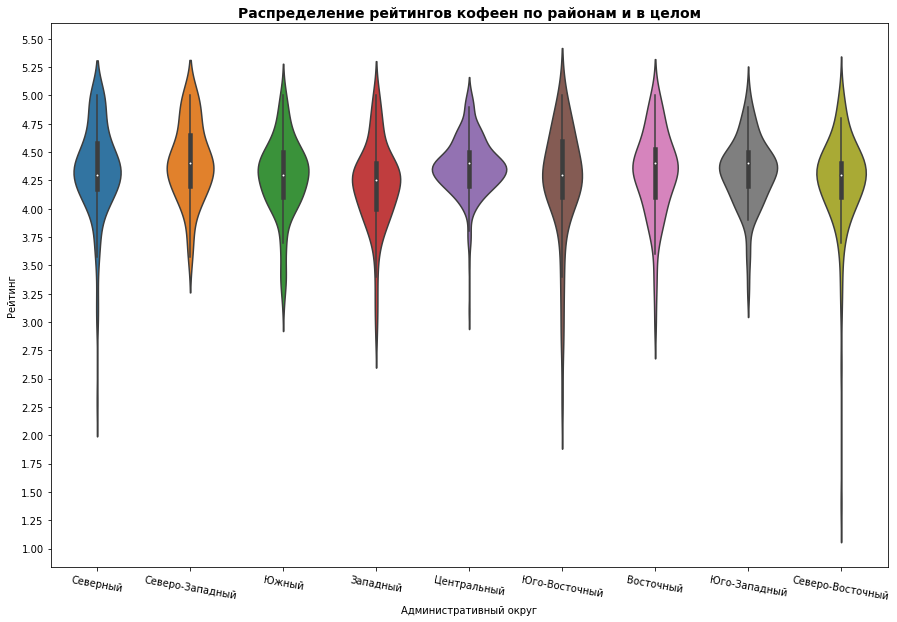

In [87]:
coffee_houses_ratings_by_district = coffee_houses.groupby(['district_short', 'name'],
                                     as_index=False).agg({'rating': 'mean'}).sort_values(by='rating', ascending=False)
plt.figure(figsize=(15, 10))
sns.violinplot(x='district_short',
               y='rating',
               data=coffee_houses_ratings_by_district)

plt.gca().yaxis.set_major_locator(MultipleLocator(0.25))

plt.xticks(rotation=-10)
plt.xlabel('Административный округ')
plt.ylabel('Рейтинг')
plt.title('Распределение рейтингов кофеен по районам и в целом',
          fontsize=14,
          fontweight='bold')
plt.show()

Относительно высокий средний рейтинг демонстрируют Центральный и Северо-Западный. Самые низкие средние рейтинги в Западный и Северо-Восточный. 

Различия в средних рейтингах не очень большие между всеми районами.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [88]:
coffee_cup = coffee_houses.groupby('district', as_index=False).agg({
    'middle_coffee_cup':
    'mean'
}).sort_values(by='middle_coffee_cup', ascending=False)

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.5,
    legend_name='Средние рейтинги кофеен по районам',
    reset=True,
).add_to(m)

m

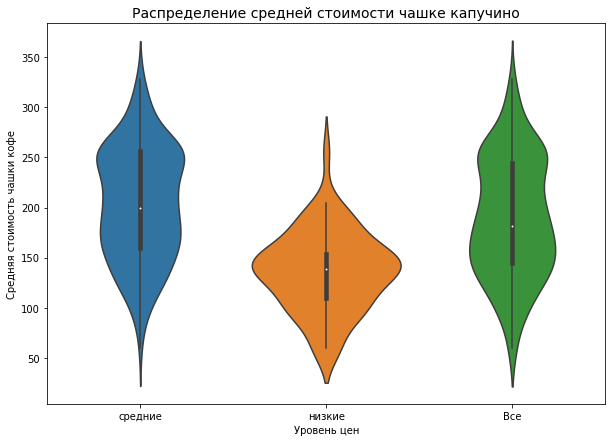

In [89]:
coffeee_price = coffee_houses.query('price == "низкие" or price == "средние"')\
[['price', 'middle_coffee_cup']]

coffeee_price = pd.concat([coffeee_price,pd.DataFrame({
        'price':
        'Все',
        'middle_coffee_cup':
        coffeee_price['middle_coffee_cup']
    })
])

plt.figure(figsize=(10, 7))

sns.violinplot(x='price',
               y='middle_coffee_cup',
               data=coffeee_price)

plt.xlabel('Уровень цен')
plt.ylabel('Средняя стоимость чашки кофе')
plt.title('Распределение средней стоимости чашке капучино',
          fontsize=14)
        
plt.show()

In [90]:
coffee_houses['middle_coffee_cup'].mean()

172.15992292870905

Средняя чашка капучино в кофейнях Москвы 172 рубля

Самый дорогой кофе — в Центральный, Западный и Юго-Западный. Самый дешёвый — в Восточном.

### Анализ посадочных мест

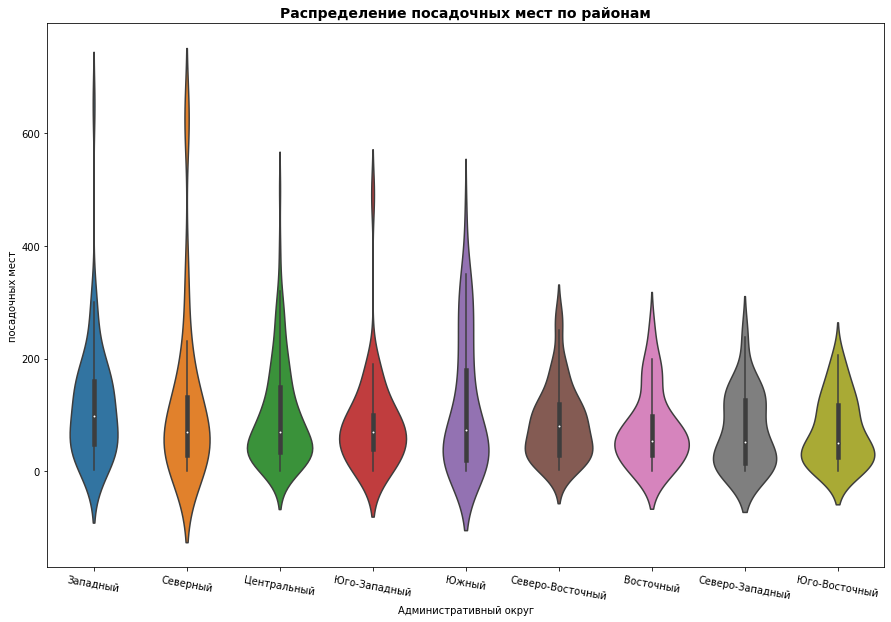

In [91]:
coffee_houses_seats = coffee_houses.groupby(['district_short', 'name'],
                                     as_index=False).agg({'seats': 'mean'}).sort_values(by='seats', ascending=False)
plt.figure(figsize=(15, 10))
sns.violinplot(x='district_short',
               y='seats',
               data=coffee_houses_seats)


plt.xticks(rotation=-10)
plt.xlabel('Административный округ')
plt.ylabel('посадочных мест')
plt.title('Распределение посадочных мест по районам',
          fontsize=14,
          fontweight='bold')
plt.show()

In [92]:
fig = px.bar(coffee_houses.groupby(['district_short'],as_index=False).agg({'seats': 'median'})
             .sort_values(by='seats', ascending=False),
             x='seats',
             y='district_short',
             text='seats',
             title='Распределение посадочных мест по районам',
             template='simple_white',
             labels={
                 'seats': 'Количество посадочных мест',
                 'district_short': 'Административный округ'
             },)
fig.update_layout(yaxis_categoryorder='total ascending', title_pad_l=250)

fig.show()

In [93]:
coffee_houses.groupby('seats', as_index=False).agg({'name':'count'}).sort_values(by='name', ascending=False).head()

,seats,name
74,100.0,36
30,40.0,26
82,120.0,25
61,80.0,25
0,0.0,24


Больше всего кофеен со 100 посадочными местами. В центральном районе в среднем 86 посадочных мест.

### Вывод

Кофеен в датасете: 1393.<br>
Доля кофеен в датасете: 18%<br>
Больше всего в Центральном административном округе, в остальных районах меньше, как минимум в два раза.<br>
Больше всего кофеен на проспекте Мира, на Ленинградском и Ленинском проспектах их поменьше. На остальных улицах число кофеен не превышает 18.<br>
Кофейные улицы находятся в основном в центре или очень близко к Третьему транспортному кольцу.<br>
Круглосуточных кофеен всего 5,38%. Это очень мало. Получается, круглосуточных кофеен мало.<br>
Самый популярный режим работы кофеен ежедневно, 10:00–22:00<br>
Относительно высокий средний рейтинг демонстрируют Центральный и Северо-Западный. Самые низкие средние рейтинги в Западный и Северо-Восточный.<br>
Различия в средних рейтингах не очень большие между всеми районами.<br>
Средняя чашка капучино в кофейнях Москвы: 172 рубля<br>
Самый дорогой кофе — в Центральный, Западный и Юго-Западный. Самый дешёвый — в Восточном.<br>
Больше всего кофеен со 100 посадочными местами. В центральном районе в среднем 86 посадочных мест.<br>

## Шаг 5. Подготовка презентации

Презентация: <https://disk.yandex.ru/i/ZicK6YUc2G2h4g>

## Выводы

<b>Было изучено и проведена предобработка данных:</b>

Общее кол-во записей о заведениях 8406 в датасете.<br>
Все типы данных в столбцах датафрейма, кроме float в столбце `seats`, логически соответствуют необходимым по смыслу.<br>
Пропуски присутсвуют в столбцах : `hours price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`.<br>
Столбец `name` может содержать неявные дубликаты.

Удалены неявные дубликаты в названиях заведений, восстановлен сетевой статус для некоторых заведений, некоторые названия приведены к уникальному виду, установлено отстутсвие явных дубликатов.<br>
Удалены пропуски в столбце `hours`, остальные столбы остались с пропусками так как — слишком много пропусков и слишком разнообразные и специфические данные.<br>
Удалены выбросы в столбцах `middle_avg_bill` и `middle_coffee_cup`, `seats`.<br>
Добавлены столбцы `street`, `is_24/7`<br>


<b>Аналих Данных:</b>

Количественные показатели:<br>
Самое большое кол-во заведений приходится на три категории: кафе, ресторан и кофейня;<br>
Самое большое среднее кол-во посадочных мест приходится на три категории: ресторан, бар и кофейня;<br>
Категория Кофейня - самая многочисленная из топ-15;<br>
Категории быстрое питание, бар/паб и столовые самые малочисленные.<br>

Качественные показатели:<br>
Самый высокий средний рейтинг наблюдается у "бар,паб", самый низкий у "быстрое питание";<br>
Распределение среднийх рейтингов нормальное/<br>

Итоги анализа сетевых и несетевых заведений:<br>
Сетевых заведений в датасете значительно меньше;<br>
У сетевых заведений чаще встречаются категории: кофейни, пицерии, булочная.<br>

Территориальные выводы:<br>
В датасете представлены 9 административных районов;<br>
В Центральном административном округе значительно больше расположено заведений, чем в остальных;<br>
Самые высокий рейтинги заведений в центре Москвы;<br>
На проспекте Мира размещено значительно больше заведений, чем на остальных;<br>
Чаще всего единственным расположенным на улице заведением являются кафе;<br>
Наибольший средний чек в Центральном и Западном районе Москвы.<br>


<b>Исследование кофейн:</b>

Кофеен в датасете: 1396.<br>
Доля кофеен в датасете: 18%<br>
Больше всего в Центральном административном округе, в остальных районах меньше, как минимум в два раза.<br>
Больше всего кофеен на проспекте Мира, на Ленинградском и Ленинском проспектах их поменьше. На остальных улицах число кофеен не превышает 18.<br>
Кофейные улицы находятся в основном в центре или очень близко к Третьему транспортному кольцу.<br>
Круглосуточных кофеен всего 5,38%. Это очень мало. Получается, круглосуточных кофеен мало.<br>
Самый популярный режим работы кофеен ежедневно, 10:00–22:00<br>
Относительно высокий средний рейтинг демонстрируют Центральный и Северо-Западный. Самые низкие средние рейтинги в Западный и Северо-Восточный.<br>
Различия в средних рейтингах не очень большие между всеми районами.<br>
Средняя чашка капучино в кофейнях Москвы: 172 рубля<br>
Самый дорогой кофе — в Центральный, Западный и Юго-Западный. Самый дешёвый — в Восточном.<br>
Больше всего кофеен со 100 посадочными местами. В центральном районе в среднем 86 посадочных мест.<br>


## Рекомендации открытие кофейни в стиле Central Perk

Расположение: Центральный административный район Москвы<br>

Преимущества Центрального административного района Москвы:<br>
- Наибольший средний чек<br>
- Самые высокие рейтинги заведений<br>
- Самая большая концентрация самых популярных заведений (топ15)<br>
- Высокая концентрация подобных заведений (высокая конкуренция косвенно предполагает повышенный спрос).<br>

Кол-во посадочных мест: 86<br>
Стоимости одной чашки кофе: больше средней стоимости (172 рубля)<br>
Режим работы: ежедневно, 10:00–22:00<br>
Основной конкурент: сетевые кофейни<br>